In [152]:
################################数据导入################################
import pandas as pd
import numpy as np
expre = pd.read_csv("./network3/net3_expression_data.tsv", sep="\t")
HGS = pd.read_csv(
    "./network3/DREAM5_NetworkInference_GoldStandard_Network3 - E. coli.tsv", sep="\t", header=None)
tf_names = pd.read_csv(
    "./network3/net3_transcription_factors.tsv", sep=",", header=None)
gene_names = pd.read_csv("./network3/net3_gene_ids.tsv", sep="\t")
expre = expre.T
del gene_names["Name"]

In [153]:
################################判断tf与HGS包含关系################################
#expre["name"] = gene_names
#expre = expre.set_index("name",drop=True)
tf_names_list = list(tf_names[0])
name_list = list(gene_names["#ID"])
s = 0
for i in range(len(HGS[0])):
    if HGS[0][i] in tf_names_list:
        pass
    else:
        s += 1
print(s)  # 如果是0说明所有的tf都在HGS内

0


In [154]:
################################数据预处理################################
import numpy as np
network_tf = np.zeros((len(tf_names), len(gene_names)))
for i in range(len(HGS)):
    if HGS[2].iloc[i] == 1:
        try:
            network_tf[tf_names_list.index(
                HGS[0].iloc[i]), name_list.index(HGS[1].iloc[i])] = 1
        except:
            pass
    else:
        try:
            network_tf[tf_names_list.index(
                HGS[0].iloc[i]), name_list.index(HGS[1].iloc[i])] = 1
        except:
            pass
network_tf
network = np.zeros((len(gene_names), len(gene_names)))
num_1 = 0
for i in range(len(HGS)):
    if HGS[2].iloc[i] == 1:
        network[name_list.index(HGS[0].iloc[i]),
                name_list.index(HGS[1].iloc[i])] = 1
    else:
        network[name_list.index(HGS[0].iloc[i]),
                name_list.index(HGS[1].iloc[i])] = -1
    num_1 += 1
s = 0
k = 0
for i in range(len(network)):
    if sum(network[i]) != 0:
        s += sum(abs(network[i]))
        k += 1
print(s/k)
print((num_1/len(gene_names)**2)**0.5)
new_expre = expre.T
network_predict_tf = np.zeros((len(gene_names), len(gene_names)))

1080.0
0.0865064732866811


In [155]:
################################数据展示################################
len(network_tf.T[0])
#sum(network_tf.T[0])

334

In [156]:
################################算法函数区################################

import torch.nn.functional as F
import torch.nn as nn
import torch
import heapq
import numpy as np
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoLarsCV
from sklearn.linear_model import OrthogonalMatchingPursuit
from sklearn.linear_model import OrthogonalMatchingPursuitCV
from sklearn.kernel_ridge import KernelRidge
from sklearn.ensemble import RandomForestRegressor
import math


def model(p, t):
    K, a, b = p
    exp_value = np.exp(-a*(t-b))
    return K/(1+exp_value)  # 定义logistics函数


def cost_function(A, x, b):
    return (A)  # 定义 cost function


tf_exp = []
for i in range(len(tf_names)):

    tf_exp.append(new_expre[tf_names.iloc[i].at[0]])
tf_exp = pd.DataFrame(tf_exp)
tf_exp = tf_exp.T


def take_AUC(network_predict_tf, network):
    a = network.reshape(len(network)*len(network[0]), 1).copy()
    b = network_predict_tf.reshape(
        len(network_predict_tf)*len(network_predict_tf[0]), 1).copy()
    a[a == 1] = 2
    a[a == 0] = 1
    b[b == 1] = 2
    b[b == 0] = 1
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve, auc
    print(a)
    print(b)
    auc_score4 = roc_auc_score(a, b)
    fpr3, tpr3, thersholds3 = roc_curve(a, b, pos_label=2)
    print(auc_score4)


# ista实现代码


def shrinkage(x, theta):
    return np.multiply(np.sign(x), np.maximum(np.abs(x) - theta, 0))


def ista(X, W_d, a, L, max_iter, eps):
    #print(X.shape)
    #print(W_d.shape)
    eig, eig_vector = np.linalg.eig(W_d.T * W_d)
    print(np.max(eig))
    assert L > np.max(eig)
    del eig, eig_vector

    W_e = W_d.T / L

    recon_errors = []
    #print(W_d.shape[1])
    Z_old = np.zeros((W_d.shape[1], 1))
    #print(Z_old.shape)
    for i in range(max_iter):
        temp = W_d * Z_old - X
        #print(W_e * temp)
        Z_new = shrinkage(Z_old - W_e * temp, a / L)
        if np.sum(np.abs(Z_new - Z_old)) <= eps:
            break
        Z_old = Z_new
        recon_error = np.linalg.norm(X - W_d * Z_new, 2) ** 2
        recon_errors.append(recon_error)
        #print(recon_error)
    return Z_new, recon_errors


def cs_CoSaMP(y, D):
    S = math.floor(y.shape[0]/4)  # 稀疏度
    residual = y  # 初始化残差
    pos_last = np.array([], dtype=np.int64)
    result = np.zeros((len(tf_names_list)))

    for j in range(S):  # 迭代次数
        product = np.fabs(np.dot(D.T, residual))
        pos_temp = np.argsort(product)
        pos_temp = pos_temp[::-1]  # 反向，得到前面L个大的位置
        pos_temp = pos_temp[0:2*S]  # 对应步骤3
        pos = np.union1d(pos_temp, pos_last)

        result_temp = np.zeros((len(tf_names_list)))
        result_temp[pos] = np.dot(np.linalg.pinv(D[:, pos]), y)

        pos_temp = np.argsort(np.fabs(result_temp))
        pos_temp = pos_temp[::-1]  # 反向，得到前面L个大的位置
        result[pos_temp[:S]] = result_temp[pos_temp[:S]]
        pos_last = pos_temp
        residual = y-np.dot(D, result)

    return result


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


class LISTA(nn.Module):
    def __init__(self, n, m, W_e, max_iter, L, theta):
        """
        # Arguments
            n: int, dimensions of the measurement
            m: int, dimensions of the sparse signal
            W_e: array, dictionary
            max_iter:int, max number of internal iteration
            L: Lipschitz const 
            theta: Thresholding
        """

        super(LISTA, self).__init__()
        self._W = nn.Linear(in_features=n, out_features=m, bias=False)
        self._S = nn.Linear(in_features=m, out_features=m,
                            bias=False)
        self.shrinkage = nn.Softshrink(theta)
        self.theta = theta
        self.max_iter = max_iter
        self.A = W_e
        self.L = L

    # weights initialization based on the dictionary
    def weights_init(self):
        A = self.A.cpu().numpy()
        L = self.L
        S = torch.from_numpy(np.eye(A.shape[1]) - (1/L)*np.matmul(A.T, A))
        S = S.float().to(device)
        W = torch.from_numpy((1/L)*A.T)
        W = W.float().to(device)

        self._S.weight = nn.Parameter(S)
        self._W.weight = nn.Parameter(W)

    def forward(self, y):
        x = self.shrinkage(self._W(y))

        if self.max_iter == 1:
            return x

        for iter in range(self.max_iter):
            x = self.shrinkage(self._W(y) + self._S(x))

        return x


def train_lista(Y, dictionary, a, L, max_iter=30):

    n, m = dictionary.shape
    n_samples = Y.shape[0]
    batch_size = 128
    steps_per_epoch = n_samples // batch_size

    # convert the data into tensors
    Y = torch.from_numpy(Y)
    Y = Y.float().to(device)

    W_d = torch.from_numpy(dictionary)
    W_d = W_d.float().to(device)

    net = LISTA(n, m, W_d, max_iter=30, L=L, theta=a/L)
    # print(net)
    net = net.float().to(device)
    net.weights_init()

    # build the optimizer and criterion
    learning_rate = 1e-10
    criterion1 = nn.MSELoss()
    criterion2 = nn.L1Loss()
    all_zeros = torch.zeros(batch_size, m).to(device)
    optimizer = torch.optim.SGD(
        net.parameters(), lr=learning_rate,  momentum=0.9)

    loss_list = []
    for epoch in range(50):
        index_samples = np.random.choice(
            a=n_samples, size=n_samples, replace=False, p=None)
        Y_shuffle = Y[index_samples]
        for step in range(steps_per_epoch):
            Y_batch = Y_shuffle[step*batch_size:(step+1)*batch_size]
            optimizer.zero_grad()

            # get the outputs
            X_h = net(Y_batch)
            Y_h = torch.mm(X_h, W_d.T)

            # compute the losss
            loss1 = criterion1(Y_batch.float(), Y_h.float())
            loss2 = a * criterion2(X_h.float(), all_zeros.float())
            loss = loss1 + loss2

            loss.backward()
            optimizer.step()

            with torch.no_grad():
                loss_list.append(loss.detach().data)
            print(loss.detach().data)

    return net, loss_list

In [157]:
################################新建矩阵################################
network_predict = []
temp_list = np.zeros((len(name_list),len(tf_names_list)))

In [158]:
corr_list = []
for i in range(len(new_expre.iloc[0])):
    temp = []
    for j in range(len(tf_names_list)):
        temp.append(abs((new_expre[gene_names["#ID"][i]].corr(tf_exp[tf_names_list[j]].T))))
    corr_list.append(temp)
for i in range(len(corr_list[0])):
    corr_list[i][i] = 0
corr_list

[[0,
  0.33335288228516025,
  0.35015198387426144,
  0.04277120939827157,
  0.6203793576128249,
  0.07833422393032038,
  0.05006027169110233,
  0.024136031192718174,
  0.49915037251902805,
  0.18293759370659035,
  0.06985965113646293,
  0.09324899539449523,
  0.33647840860571826,
  0.1536551017619385,
  0.05812307730720676,
  0.1541477765207485,
  0.30297268689899115,
  0.3497091454824093,
  0.04181559702520142,
  0.24555479408053565,
  0.1516110799038951,
  0.08478983737205041,
  0.43423325764763643,
  0.3958792362429866,
  0.08374934849830062,
  0.2859532057488167,
  0.015014250870019325,
  0.03349863415491046,
  0.5112234478739851,
  0.001037615585003997,
  0.10176298236866609,
  0.11101410840537472,
  0.2879319175973484,
  0.0049920872203826116,
  0.3312195625792647,
  0.014111278485299162,
  0.3511713547454285,
  0.16419361310654942,
  0.12303355903224521,
  0.033956871392695515,
  0.23939810341016715,
  0.16592057248821596,
  0.27841047244028994,
  0.28279622427270257,
  0.368364

In [167]:
len(tf_names_list)

334

In [159]:
temp_list = np.zeros((len(name_list),len(tf_names_list)))
corr_list = np.array(corr_list)
for i in range(len(corr_list)):
    for k in corr_list[i].argsort()[-50:][::-1]:
        temp_list[i][k] = 1
print(sum(temp_list[0]))

50.0


In [172]:
################################传统回归################################
for i in range(len(new_expre.iloc[0])):
    flag = False
    y = new_expre[gene_names["#ID"][i]]
    copy_new_expre = tf_exp.copy()
    try:
        del copy_new_expre[gene_names["#ID"][i]]
        print(gene_names["#ID"][i])
        temp_index = tf_names_list.index(gene_names["#ID"][i])
        flag = True
        print("T")  # 处理tf作为被调控因子的情况
    except:
        pass
    print(copy_new_expre.shape)
    print(y.shape)
    #model = Lasso(alpha=0)
    #model = OrthogonalMatchingPursuit(n_nonzero_coefs = 80, normalize=False)
    #model = KernelRidge(alpha = 2)
    #model = RandomForestRegressor()
    model = LassoLarsCV()
    #model = OrthogonalMatchingPursuitCV()
    model.fit(copy_new_expre, y)
    predict_list = []
    par_lists = model.coef_
    if flag:
        print(len(par_lists))
        par_lists = np.insert(par_lists, temp_index, 0)
        print(len(par_lists))
    for j in range(len(temp_list[i])):
        temp_list[i][j] = par_lists[j]
    # print(par_lists)
    # network_predict.append(par_lists)
    #temp_index = list(gene_names[0]).index(tf_names[0][i])
    # par_lists.insert(temp_index,0)
    #network_predict_tf[temp_index] = par_lists
    print((i/len(new_expre.iloc[0])*100), "%")
predict_tf = temp_list

G1
T
(805, 333)
(805,)
333
334
0.0 %
G2
T
(805, 333)
(805,)
333
334
0.022168033695411215 %
G3
T
(805, 333)
(805,)
333
334
0.04433606739082243 %
G4
T
(805, 333)
(805,)
333
334
0.06650410108623366 %
G5
T
(805, 333)
(805,)
333
334
0.08867213478164486 %
G6
T
(805, 333)
(805,)
333
334
0.11084016847705608 %
G7
T
(805, 333)
(805,)
333
334
0.1330082021724673 %
G8
T
(805, 333)
(805,)
333
334
0.15517623586787851 %
G9
T
(805, 333)
(805,)
333
334
0.17734426956328972 %
G10
T
(805, 333)
(805,)
333
334
0.19951230325870095 %
G11
T
(805, 333)
(805,)
333
334
0.22168033695411216 %
G12
T
(805, 333)
(805,)
333
334
0.2438483706495234 %
G13
T
(805, 333)
(805,)
333
334
0.2660164043449346 %
G14
T
(805, 333)
(805,)
333
334
0.2881844380403458 %
G15
T
(805, 333)
(805,)
333
334
0.31035247173575703 %
G16
T
(805, 333)
(805,)
333
334
0.3325205054311683 %
G17
T
(805, 333)
(805,)
333
334
0.35468853912657944 %
G18
T
(805, 333)
(805,)
333
334
0.3768565728219907 %
G19
T
(805, 333)
(805,)
333
334
0.3990246065174019 %
G20
T

333
334
3.4138771890933275 %
G156
T
(805, 333)
(805,)
333
334
3.436045222788739 %
G157
T
(805, 333)
(805,)
333
334
3.45821325648415 %
G158
T
(805, 333)
(805,)
333
334
3.480381290179561 %
G159
T
(805, 333)
(805,)
333
334
3.5025493238749728 %
G160
T
(805, 333)
(805,)
333
334
3.524717357570384 %
G161
T
(805, 333)
(805,)
333
334
3.5468853912657945 %
G162
T
(805, 333)
(805,)
333
334
3.5690534249612056 %
G163
T
(805, 333)
(805,)
333
334
3.5912214586566167 %
G164
T
(805, 333)
(805,)
333
334
3.613389492352028 %
G165
T
(805, 333)
(805,)
333
334
3.6355575260474393 %
G166
T
(805, 333)
(805,)
333
334
3.6577255597428504 %
G167
T
(805, 333)
(805,)
333
334
3.679893593438262 %
G168
T
(805, 333)
(805,)
333
334
3.702061627133673 %
G169
T
(805, 333)
(805,)
333
334
3.724229660829084 %
G170
T
(805, 333)
(805,)
333
334
3.7463976945244957 %
G171
T
(805, 333)
(805,)
333
334
3.7685657282199068 %
G172
T
(805, 333)
(805,)
333
334
3.790733761915318 %
G173
T
(805, 333)
(805,)
333
334
3.8129017956107294 %
G174
T
(8

333
334
6.849922411882066 %
G311
T
(805, 333)
(805,)
333
334
6.872090445577478 %
G312
T
(805, 333)
(805,)
333
334
6.894258479272889 %
G313
T
(805, 333)
(805,)
333
334
6.9164265129683 %
G314
T
(805, 333)
(805,)
333
334
6.938594546663711 %
G315
T
(805, 333)
(805,)
333
334
6.960762580359122 %
G316
T
(805, 333)
(805,)
333
334
6.982930614054533 %
G317
T
(805, 333)
(805,)
333
334
7.0050986477499455 %
G318
T
(805, 333)
(805,)
333
334
7.027266681445356 %
G319
T
(805, 333)
(805,)
333
334
7.049434715140768 %
G320
T
(805, 333)
(805,)
333
334
7.071602748836178 %
G321
T
(805, 333)
(805,)
333
334
7.093770782531589 %
G322
T
(805, 333)
(805,)
333
334
7.1159388162270005 %
G323
T
(805, 333)
(805,)
333
334
7.138106849922411 %
G324
T
(805, 333)
(805,)
333
334
7.160274883617824 %
G325
T
(805, 333)
(805,)
333
334
7.182442917313233 %
G326
T
(805, 333)
(805,)
333
334
7.204610951008646 %
G327
T
(805, 333)
(805,)
333
334
7.226778984704056 %
G328
T
(805, 333)
(805,)
333
334
7.248947018399468 %
G329
T
(805, 333)


11.416537353136777 %
(805, 334)
(805,)
11.438705386832188 %
(805, 334)
(805,)
11.4608734205276 %
(805, 334)
(805,)
11.48304145422301 %
(805, 334)
(805,)
11.505209487918421 %
(805, 334)
(805,)
11.527377521613833 %
(805, 334)
(805,)
11.549545555309244 %
(805, 334)
(805,)
11.571713589004656 %
(805, 334)
(805,)
11.593881622700067 %
(805, 334)
(805,)
11.616049656395477 %
(805, 334)
(805,)
11.638217690090888 %
(805, 334)
(805,)
11.6603857237863 %
(805, 334)
(805,)
11.682553757481712 %
(805, 334)
(805,)
11.704721791177123 %
(805, 334)
(805,)
11.726889824872535 %
(805, 334)
(805,)
11.749057858567944 %
(805, 334)
(805,)
11.771225892263356 %
(805, 334)
(805,)
11.793393925958767 %
(805, 334)
(805,)
11.815561959654179 %
(805, 334)
(805,)
11.83772999334959 %
(805, 334)
(805,)
11.859898027045002 %
(805, 334)
(805,)
11.882066060740412 %
(805, 334)
(805,)
11.904234094435823 %
(805, 334)
(805,)
11.926402128131235 %
(805, 334)
(805,)
11.948570161826646 %
(805, 334)
(805,)
11.970738195522056 %
(805, 334)

16.116160496563957 %
(805, 334)
(805,)
16.138328530259365 %
(805, 334)
(805,)
16.160496563954776 %
(805, 334)
(805,)
16.182664597650188 %
(805, 334)
(805,)
16.2048326313456 %
(805, 334)
(805,)
16.22700066504101 %
(805, 334)
(805,)
16.249168698736423 %
(805, 334)
(805,)
16.27133673243183 %
(805, 334)
(805,)
16.293504766127246 %
(805, 334)
(805,)
16.315672799822657 %
(805, 334)
(805,)
16.337840833518065 %
(805, 334)
(805,)
16.360008867213477 %
(805, 334)
(805,)
16.382176900908892 %
(805, 334)
(805,)
16.4043449346043 %
(805, 334)
(805,)
16.42651296829971 %
(805, 334)
(805,)
16.448681001995123 %
(805, 334)
(805,)
16.470849035690534 %
(805, 334)
(805,)
16.493017069385946 %
(805, 334)
(805,)
16.515185103081357 %
(805, 334)
(805,)
16.537353136776765 %
(805, 334)
(805,)
16.55952117047218 %
(805, 334)
(805,)
16.581689204167592 %
(805, 334)
(805,)
16.603857237863 %
(805, 334)
(805,)
16.62602527155841 %
(805, 334)
(805,)
16.648193305253827 %
(805, 334)
(805,)
16.670361338949235 %
(805, 334)
(805,

20.837951673686543 %
(805, 334)
(805,)
20.860119707381955 %
(805, 334)
(805,)
20.882287741077366 %
(805, 334)
(805,)
20.904455774772778 %
(805, 334)
(805,)
20.92662380846819 %
(805, 334)
(805,)
20.9487918421636 %
(805, 334)
(805,)
20.97095987585901 %
(805, 334)
(805,)
20.993127909554424 %
(805, 334)
(805,)
21.015295943249836 %
(805, 334)
(805,)
21.037463976945244 %
(805, 334)
(805,)
21.059632010640655 %
(805, 334)
(805,)
21.08180004433607 %
(805, 334)
(805,)
21.10396807803148 %
(805, 334)
(805,)
21.12613611172689 %
(805, 334)
(805,)
21.1483041454223 %
(805, 334)
(805,)
21.170472179117713 %
(805, 334)
(805,)
21.192640212813124 %
(805, 334)
(805,)
21.214808246508536 %
(805, 334)
(805,)
21.236976280203944 %
(805, 334)
(805,)
21.259144313899355 %
(805, 334)
(805,)
21.28131234759477 %
(805, 334)
(805,)
21.30348038129018 %
(805, 334)
(805,)
21.32564841498559 %
(805, 334)
(805,)
21.347816448681 %
(805, 334)
(805,)
21.369984482376413 %
(805, 334)
(805,)
21.392152516071825 %
(805, 334)
(805,)
2

25.55974285080913 %
(805, 334)
(805,)
25.581910884504545 %
(805, 334)
(805,)
25.604078918199956 %
(805, 334)
(805,)
25.626246951895364 %
(805, 334)
(805,)
25.64841498559078 %
(805, 334)
(805,)
25.67058301928619 %
(805, 334)
(805,)
25.6927510529816 %
(805, 334)
(805,)
25.714919086677014 %
(805, 334)
(805,)
25.737087120372422 %
(805, 334)
(805,)
25.759255154067834 %
(805, 334)
(805,)
25.78142318776325 %
(805, 334)
(805,)
25.803591221458653 %
(805, 334)
(805,)
25.82575925515407 %
(805, 334)
(805,)
25.847927288849483 %
(805, 334)
(805,)
25.870095322544888 %
(805, 334)
(805,)
25.892263356240303 %
(805, 334)
(805,)
25.91443138993571 %
(805, 334)
(805,)
25.936599423631122 %
(805, 334)
(805,)
25.958767457326537 %
(805, 334)
(805,)
25.980935491021945 %
(805, 334)
(805,)
26.003103524717357 %
(805, 334)
(805,)
26.025271558412772 %
(805, 334)
(805,)
26.04743959210818 %
(805, 334)
(805,)
26.06960762580359 %
(805, 334)
(805,)
26.091775659499 %
(805, 334)
(805,)
26.113943693194415 %
(805, 334)
(805,)

30.281534027931723 %
(805, 334)
(805,)
30.303702061627135 %
(805, 334)
(805,)
30.325870095322543 %
(805, 334)
(805,)
30.348038129017958 %
(805, 334)
(805,)
30.370206162713366 %
(805, 334)
(805,)
30.392374196408777 %
(805, 334)
(805,)
30.414542230104193 %
(805, 334)
(805,)
30.4367102637996 %
(805, 334)
(805,)
30.458878297495012 %
(805, 334)
(805,)
30.481046331190427 %
(805, 334)
(805,)
30.503214364885835 %
(805, 334)
(805,)
30.525382398581247 %
(805, 334)
(805,)
30.547550432276655 %
(805, 334)
(805,)
30.569718465972066 %
(805, 334)
(805,)
30.59188649966748 %
(805, 334)
(805,)
30.61405453336289 %
(805, 334)
(805,)
30.6362225670583 %
(805, 334)
(805,)
30.658390600753716 %
(805, 334)
(805,)
30.680558634449124 %
(805, 334)
(805,)
30.702726668144535 %
(805, 334)
(805,)
30.724894701839943 %
(805, 334)
(805,)
30.74706273553536 %
(805, 334)
(805,)
30.76923076923077 %
(805, 334)
(805,)
30.791398802926178 %
(805, 334)
(805,)
30.813566836621593 %
(805, 334)
(805,)
30.835734870317005 %
(805, 334)
(

35.025493238749725 %
(805, 334)
(805,)
35.04766127244513 %
(805, 334)
(805,)
35.06982930614054 %
(805, 334)
(805,)
35.091997339835956 %
(805, 334)
(805,)
35.11416537353137 %
(805, 334)
(805,)
35.13633340722678 %
(805, 334)
(805,)
35.158501440922194 %
(805, 334)
(805,)
35.1806694746176 %
(805, 334)
(805,)
35.20283750831301 %
(805, 334)
(805,)
35.225005542008425 %
(805, 334)
(805,)
35.24717357570383 %
(805, 334)
(805,)
35.26934160939925 %
(805, 334)
(805,)
35.291509643094656 %
(805, 334)
(805,)
35.313677676790064 %
(805, 334)
(805,)
35.33584571048548 %
(805, 334)
(805,)
35.35801374418089 %
(805, 334)
(805,)
35.3801817778763 %
(805, 334)
(805,)
35.40234981157172 %
(805, 334)
(805,)
35.424517845267125 %
(805, 334)
(805,)
35.44668587896253 %
(805, 334)
(805,)
35.46885391265795 %
(805, 334)
(805,)
35.49102194635336 %
(805, 334)
(805,)
35.51318998004877 %
(805, 334)
(805,)
35.53535801374418 %
(805, 334)
(805,)
35.557526047439595 %
(805, 334)
(805,)
35.579694081135 %
(805, 334)
(805,)
35.60186

39.79162048326314 %
(805, 334)
(805,)
39.813788516958546 %
(805, 334)
(805,)
39.835956550653954 %
(805, 334)
(805,)
39.85812458434937 %
(805, 334)
(805,)
39.88029261804478 %
(805, 334)
(805,)
39.90246065174019 %
(805, 334)
(805,)
39.92462868543561 %
(805, 334)
(805,)
39.94679671913101 %
(805, 334)
(805,)
39.96896475282642 %
(805, 334)
(805,)
39.99113278652184 %
(805, 334)
(805,)
40.013300820217246 %
(805, 334)
(805,)
40.03546885391266 %
(805, 334)
(805,)
40.05763688760807 %
(805, 334)
(805,)
40.07980492130348 %
(805, 334)
(805,)
40.10197295499889 %
(805, 334)
(805,)
40.1241409886943 %
(805, 334)
(805,)
40.146309022389715 %
(805, 334)
(805,)
40.16847705608513 %
(805, 334)
(805,)
40.19064508978054 %
(805, 334)
(805,)
40.21281312347595 %
(805, 334)
(805,)
40.234981157171354 %
(805, 334)
(805,)
40.25714919086677 %
(805, 334)
(805,)
40.279317224562185 %
(805, 334)
(805,)
40.30148525825759 %
(805, 334)
(805,)
40.32365329195301 %
(805, 334)
(805,)
40.345821325648416 %
(805, 334)
(805,)
40.367

44.55774772777655 %
(805, 334)
(805,)
44.57991576147195 %
(805, 334)
(805,)
44.60208379516737 %
(805, 334)
(805,)
44.62425182886278 %
(805, 334)
(805,)
44.64641986255819 %
(805, 334)
(805,)
44.668587896253605 %
(805, 334)
(805,)
44.69075592994901 %
(805, 334)
(805,)
44.71292396364442 %
(805, 334)
(805,)
44.735091997339836 %
(805, 334)
(805,)
44.757260031035244 %
(805, 334)
(805,)
44.77942806473066 %
(805, 334)
(805,)
44.801596098426074 %
(805, 334)
(805,)
44.82376413212148 %
(805, 334)
(805,)
44.84593216581689 %
(805, 334)
(805,)
44.8681001995123 %
(805, 334)
(805,)
44.89026823320771 %
(805, 334)
(805,)
44.91243626690313 %
(805, 334)
(805,)
44.93460430059854 %
(805, 334)
(805,)
44.95677233429395 %
(805, 334)
(805,)
44.97894036798936 %
(805, 334)
(805,)
45.00110840168477 %
(805, 334)
(805,)
45.02327643538018 %
(805, 334)
(805,)
45.04544446907559 %
(805, 334)
(805,)
45.067612502771006 %
(805, 334)
(805,)
45.08978053646642 %
(805, 334)
(805,)
45.11194857016182 %
(805, 334)
(805,)
45.13411

49.32387497228996 %
(805, 334)
(805,)
49.346043005985365 %
(805, 334)
(805,)
49.36821103968078 %
(805, 334)
(805,)
49.39037907337619 %
(805, 334)
(805,)
49.4125471070716 %
(805, 334)
(805,)
49.43471514076702 %
(805, 334)
(805,)
49.456883174462426 %
(805, 334)
(805,)
49.479051208157834 %
(805, 334)
(805,)
49.50121924185324 %
(805, 334)
(805,)
49.52338727554866 %
(805, 334)
(805,)
49.54555530924407 %
(805, 334)
(805,)
49.56772334293948 %
(805, 334)
(805,)
49.589891376634895 %
(805, 334)
(805,)
49.6120594103303 %
(805, 334)
(805,)
49.63422744402571 %
(805, 334)
(805,)
49.65639547772113 %
(805, 334)
(805,)
49.678563511416534 %
(805, 334)
(805,)
49.70073154511195 %
(805, 334)
(805,)
49.722899578807365 %
(805, 334)
(805,)
49.745067612502766 %
(805, 334)
(805,)
49.76723564619818 %
(805, 334)
(805,)
49.789403679893596 %
(805, 334)
(805,)
49.811571713589004 %
(805, 334)
(805,)
49.83373974728442 %
(805, 334)
(805,)
49.85590778097983 %
(805, 334)
(805,)
49.878075814675235 %
(805, 334)
(805,)
49.9

54.09000221680337 %
(805, 334)
(805,)
54.11217025049878 %
(805, 334)
(805,)
54.13433828419419 %
(805, 334)
(805,)
54.15650631788961 %
(805, 334)
(805,)
54.17867435158501 %
(805, 334)
(805,)
54.200842385280424 %
(805, 334)
(805,)
54.22301041897584 %
(805, 334)
(805,)
54.24517845267125 %
(805, 334)
(805,)
54.26734648636666 %
(805, 334)
(805,)
54.28951452006206 %
(805, 334)
(805,)
54.31168255375748 %
(805, 334)
(805,)
54.33385058745289 %
(805, 334)
(805,)
54.35601862114831 %
(805, 334)
(805,)
54.37818665484372 %
(805, 334)
(805,)
54.40035468853913 %
(805, 334)
(805,)
54.42252272223453 %
(805, 334)
(805,)
54.44469075592995 %
(805, 334)
(805,)
54.46685878962536 %
(805, 334)
(805,)
54.48902682332077 %
(805, 334)
(805,)
54.511194857016186 %
(805, 334)
(805,)
54.53336289071159 %
(805, 334)
(805,)
54.555530924407 %
(805, 334)
(805,)
54.57769895810242 %
(805, 334)
(805,)
54.59986699179783 %
(805, 334)
(805,)
54.62203502549324 %
(805, 334)
(805,)
54.64420305918865 %
(805, 334)
(805,)
54.666371092

58.85612946131678 %
(805, 334)
(805,)
58.87829749501219 %
(805, 334)
(805,)
58.9004655287076 %
(805, 334)
(805,)
58.922633562403014 %
(805, 334)
(805,)
58.94480159609843 %
(805, 334)
(805,)
58.966969629793844 %
(805, 334)
(805,)
58.989137663489245 %
(805, 334)
(805,)
59.01130569718466 %
(805, 334)
(805,)
59.03347373088007 %
(805, 334)
(805,)
59.05564176457548 %
(805, 334)
(805,)
59.0778097982709 %
(805, 334)
(805,)
59.0999778319663 %
(805, 334)
(805,)
59.122145865661714 %
(805, 334)
(805,)
59.14431389935713 %
(805, 334)
(805,)
59.16648193305254 %
(805, 334)
(805,)
59.18864996674795 %
(805, 334)
(805,)
59.21081800044337 %
(805, 334)
(805,)
59.23298603413877 %
(805, 334)
(805,)
59.255154067834184 %
(805, 334)
(805,)
59.27732210152959 %
(805, 334)
(805,)
59.29949013522501 %
(805, 334)
(805,)
59.32165816892042 %
(805, 334)
(805,)
59.34382620261582 %
(805, 334)
(805,)
59.36599423631124 %
(805, 334)
(805,)
59.38816227000665 %
(805, 334)
(805,)
59.41033030370206 %
(805, 334)
(805,)
59.4324983

63.622256705830196 %
(805, 334)
(805,)
63.644424739525604 %
(805, 334)
(805,)
63.66659277322102 %
(805, 334)
(805,)
63.68876080691642 %
(805, 334)
(805,)
63.710928840611835 %
(805, 334)
(805,)
63.73309687430725 %
(805, 334)
(805,)
63.755264908002665 %
(805, 334)
(805,)
63.77743294169807 %
(805, 334)
(805,)
63.799600975393474 %
(805, 334)
(805,)
63.82176900908889 %
(805, 334)
(805,)
63.843937042784304 %
(805, 334)
(805,)
63.86610507647972 %
(805, 334)
(805,)
63.888273110175135 %
(805, 334)
(805,)
63.910441143870536 %
(805, 334)
(805,)
63.93260917756594 %
(805, 334)
(805,)
63.95477721126136 %
(805, 334)
(805,)
63.976945244956774 %
(805, 334)
(805,)
63.99911327865219 %
(805, 334)
(805,)
64.0212813123476 %
(805, 334)
(805,)
64.043449346043 %
(805, 334)
(805,)
64.06561737973841 %
(805, 334)
(805,)
64.08778541343383 %
(805, 334)
(805,)
64.10995344712924 %
(805, 334)
(805,)
64.13212148082465 %
(805, 334)
(805,)
64.15428951452006 %
(805, 334)
(805,)
64.17645754821547 %
(805, 334)
(805,)
64.198

68.43272001773443 %
(805, 334)
(805,)
68.45488805142985 %
(805, 334)
(805,)
68.47705608512526 %
(805, 334)
(805,)
68.49922411882065 %
(805, 334)
(805,)
68.52139215251607 %
(805, 334)
(805,)
68.54356018621148 %
(805, 334)
(805,)
68.5657282199069 %
(805, 334)
(805,)
68.58789625360231 %
(805, 334)
(805,)
68.61006428729772 %
(805, 334)
(805,)
68.63223232099313 %
(805, 334)
(805,)
68.65440035468853 %
(805, 334)
(805,)
68.67656838838396 %
(805, 334)
(805,)
68.69873642207936 %
(805, 334)
(805,)
68.72090445577477 %
(805, 334)
(805,)
68.74307248947018 %
(805, 334)
(805,)
68.76524052316559 %
(805, 334)
(805,)
68.78740855686101 %
(805, 334)
(805,)
68.80957659055642 %
(805, 334)
(805,)
68.83174462425184 %
(805, 334)
(805,)
68.85391265794723 %
(805, 334)
(805,)
68.87608069164266 %
(805, 334)
(805,)
68.89824872533806 %
(805, 334)
(805,)
68.92041675903347 %
(805, 334)
(805,)
68.9425847927289 %
(805, 334)
(805,)
68.96475282642429 %
(805, 334)
(805,)
68.98692086011971 %
(805, 334)
(805,)
69.00908889381

73.24318332963867 %
(805, 334)
(805,)
73.26535136333408 %
(805, 334)
(805,)
73.28751939702948 %
(805, 334)
(805,)
73.30968743072489 %
(805, 334)
(805,)
73.3318554644203 %
(805, 334)
(805,)
73.35402349811572 %
(805, 334)
(805,)
73.37619153181113 %
(805, 334)
(805,)
73.39835956550654 %
(805, 334)
(805,)
73.42052759920195 %
(805, 334)
(805,)
73.44269563289735 %
(805, 334)
(805,)
73.46486366659278 %
(805, 334)
(805,)
73.48703170028818 %
(805, 334)
(805,)
73.50919973398359 %
(805, 334)
(805,)
73.53136776767901 %
(805, 334)
(805,)
73.55353580137441 %
(805, 334)
(805,)
73.57570383506983 %
(805, 334)
(805,)
73.59787186876524 %
(805, 334)
(805,)
73.62003990246066 %
(805, 334)
(805,)
73.64220793615607 %
(805, 334)
(805,)
73.66437596985148 %
(805, 334)
(805,)
73.68654400354689 %
(805, 334)
(805,)
73.7087120372423 %
(805, 334)
(805,)
73.73088007093772 %
(805, 334)
(805,)
73.75304810463312 %
(805, 334)
(805,)
73.77521613832853 %
(805, 334)
(805,)
73.79738417202394 %
(805, 334)
(805,)
73.81955220571

78.0536466415429 %
(805, 334)
(805,)
78.0758146752383 %
(805, 334)
(805,)
78.09798270893373 %
(805, 334)
(805,)
78.12015074262912 %
(805, 334)
(805,)
78.14231877632454 %
(805, 334)
(805,)
78.16448681001995 %
(805, 334)
(805,)
78.18665484371536 %
(805, 334)
(805,)
78.20882287741078 %
(805, 334)
(805,)
78.23099091110618 %
(805, 334)
(805,)
78.2531589448016 %
(805, 334)
(805,)
78.275326978497 %
(805, 334)
(805,)
78.29749501219241 %
(805, 334)
(805,)
78.31966304588784 %
(805, 334)
(805,)
78.34183107958324 %
(805, 334)
(805,)
78.36399911327865 %
(805, 334)
(805,)
78.38616714697406 %
(805, 334)
(805,)
78.40833518066947 %
(805, 334)
(805,)
78.43050321436489 %
(805, 334)
(805,)
78.4526712480603 %
(805, 334)
(805,)
78.4748392817557 %
(805, 334)
(805,)
78.49700731545111 %
(805, 334)
(805,)
78.51917534914654 %
(805, 334)
(805,)
78.54134338284194 %
(805, 334)
(805,)
78.56351141653735 %
(805, 334)
(805,)
78.58567945023276 %
(805, 334)
(805,)
78.60784748392817 %
(805, 334)
(805,)
78.63001551762359 %

82.86410995344713 %
(805, 334)
(805,)
82.88627798714255 %
(805, 334)
(805,)
82.90844602083796 %
(805, 334)
(805,)
82.93061405453336 %
(805, 334)
(805,)
82.95278208822877 %
(805, 334)
(805,)
82.97495012192418 %
(805, 334)
(805,)
82.9971181556196 %
(805, 334)
(805,)
83.01928618931501 %
(805, 334)
(805,)
83.04145422301042 %
(805, 334)
(805,)
83.06362225670583 %
(805, 334)
(805,)
83.08579029040123 %
(805, 334)
(805,)
83.10795832409666 %
(805, 334)
(805,)
83.13012635779207 %
(805, 334)
(805,)
83.15229439148749 %
(805, 334)
(805,)
83.17446242518288 %
(805, 334)
(805,)
83.19663045887829 %
(805, 334)
(805,)
83.21879849257371 %
(805, 334)
(805,)
83.24096652626912 %
(805, 334)
(805,)
83.26313455996454 %
(805, 334)
(805,)
83.28530259365994 %
(805, 334)
(805,)
83.30747062735536 %
(805, 334)
(805,)
83.32963866105077 %
(805, 334)
(805,)
83.35180669474617 %
(805, 334)
(805,)
83.3739747284416 %
(805, 334)
(805,)
83.39614276213699 %
(805, 334)
(805,)
83.41831079583241 %
(805, 334)
(805,)
83.44047882952

87.67457326535137 %
(805, 334)
(805,)
87.69674129904678 %
(805, 334)
(805,)
87.71890933274219 %
(805, 334)
(805,)
87.7410773664376 %
(805, 334)
(805,)
87.763245400133 %
(805, 334)
(805,)
87.78541343382842 %
(805, 334)
(805,)
87.80758146752383 %
(805, 334)
(805,)
87.82974950121924 %
(805, 334)
(805,)
87.85191753491466 %
(805, 334)
(805,)
87.87408556861006 %
(805, 334)
(805,)
87.89625360230548 %
(805, 334)
(805,)
87.91842163600089 %
(805, 334)
(805,)
87.9405896696963 %
(805, 334)
(805,)
87.96275770339172 %
(805, 334)
(805,)
87.98492573708711 %
(805, 334)
(805,)
88.00709377078253 %
(805, 334)
(805,)
88.02926180447794 %
(805, 334)
(805,)
88.05142983817336 %
(805, 334)
(805,)
88.07359787186877 %
(805, 334)
(805,)
88.09576590556418 %
(805, 334)
(805,)
88.11793393925959 %
(805, 334)
(805,)
88.140101972955 %
(805, 334)
(805,)
88.16227000665042 %
(805, 334)
(805,)
88.18443804034582 %
(805, 334)
(805,)
88.20660607404123 %
(805, 334)
(805,)
88.22877410773664 %
(805, 334)
(805,)
88.25094214143205 

92.4850365772556 %
(805, 334)
(805,)
92.507204610951 %
(805, 334)
(805,)
92.52937264464643 %
(805, 334)
(805,)
92.55154067834182 %
(805, 334)
(805,)
92.57370871203725 %
(805, 334)
(805,)
92.59587674573265 %
(805, 334)
(805,)
92.61804477942806 %
(805, 334)
(805,)
92.64021281312348 %
(805, 334)
(805,)
92.66238084681889 %
(805, 334)
(805,)
92.6845488805143 %
(805, 334)
(805,)
92.70671691420971 %
(805, 334)
(805,)
92.72888494790512 %
(805, 334)
(805,)
92.75105298160054 %
(805, 334)
(805,)
92.77322101529595 %
(805, 334)
(805,)
92.79538904899135 %
(805, 334)
(805,)
92.81755708268676 %
(805, 334)
(805,)
92.83972511638218 %
(805, 334)
(805,)
92.86189315007759 %
(805, 334)
(805,)
92.884061183773 %
(805, 334)
(805,)
92.90622921746841 %
(805, 334)
(805,)
92.92839725116382 %
(805, 334)
(805,)
92.95056528485924 %
(805, 334)
(805,)
92.97273331855465 %
(805, 334)
(805,)
92.99490135225005 %
(805, 334)
(805,)
93.01706938594546 %
(805, 334)
(805,)
93.03923741964087 %
(805, 334)
(805,)
93.06140545333629 

97.29549988915983 %
(805, 334)
(805,)
97.31766792285525 %
(805, 334)
(805,)
97.33983595655066 %
(805, 334)
(805,)
97.36200399024607 %
(805, 334)
(805,)
97.38417202394147 %
(805, 334)
(805,)
97.40634005763688 %
(805, 334)
(805,)
97.4285080913323 %
(805, 334)
(805,)
97.45067612502771 %
(805, 334)
(805,)
97.47284415872312 %
(805, 334)
(805,)
97.49501219241853 %
(805, 334)
(805,)
97.51718022611394 %
(805, 334)
(805,)
97.53934825980936 %
(805, 334)
(805,)
97.56151629350477 %
(805, 334)
(805,)
97.58368432720019 %
(805, 334)
(805,)
97.60585236089558 %
(805, 334)
(805,)
97.628020394591 %
(805, 334)
(805,)
97.65018842828641 %
(805, 334)
(805,)
97.67235646198182 %
(805, 334)
(805,)
97.69452449567724 %
(805, 334)
(805,)
97.71669252937264 %
(805, 334)
(805,)
97.73886056306806 %
(805, 334)
(805,)
97.76102859676347 %
(805, 334)
(805,)
97.78319663045887 %
(805, 334)
(805,)
97.8053646641543 %
(805, 334)
(805,)
97.8275326978497 %
(805, 334)
(805,)
97.84970073154511 %
(805, 334)
(805,)
97.87186876524052

In [177]:
################################软阈值迭代算法################################
for i in range(len(new_expre.iloc[0])):  # len(new_expre.iloc[0])
    flag = False
    y = new_expre[gene_names["#ID"]].T.iloc[i]
    copy_new_expre = tf_exp.copy()
    try:
        del copy_new_expre[gene_names["#ID"][i]]
        print(gene_names["#ID"][i])
        temp_index = tf_names_list.index(gene_names["#ID"][i])
        flag = True
        print("T")  # 处理tf作为被调控因子的情况
    except:
        pass
    X = y.iloc[0]
    W_d = copy_new_expre
    #print(X.shape)
    #print(W_d)
    Z_recon, recon_errors = ista(np.mat(X), np.mat(
        W_d.values), 0.01, 20000000, 100, 0.00001)
    # print(recon_errors)
    par_lists = sum(Z_recon.T.A)
    if flag:
        print(len(par_lists))
        par_lists = np.insert(par_lists, temp_index, 0)
        print(len(par_lists))
    for j in range(len(temp_list[i])):
        predict_tf[i][j] = par_lists[j]
    # print(par_lists)
    # network_predict.append(par_lists)
    #temp_index = list(gene_names[0]).index(tf_names[0][i])
    # par_lists.insert(temp_index,0)
    #network_predict_tf[temp_index] = par_lists
    print((i/len(new_expre.iloc[0])*100), "%")

G1
T
19587656.401623018
333
334
0.0 %
G2
T
19571799.735237926
333
334
0.022168033695411215 %
G3
T
19549399.89038447
333
334
0.04433606739082243 %
G4
T
19583556.1135354
333
334
0.06650410108623366 %
G5
T
19580934.144414753
333
334
0.08867213478164486 %
G6
T
19567101.307278764
333
334
0.11084016847705608 %
G7
T
19535855.201178998
333
334
0.1330082021724673 %
G8
T
19570882.996859122
333
334
0.15517623586787851 %
G9
T
19583618.630843278
333
334
0.17734426956328972 %
G10
T
19594314.555578876
333
334
0.19951230325870095 %
G11
T
19575009.08492275
333
334
0.22168033695411216 %
G12
T
19588687.60494315
333
334
0.2438483706495234 %
G13
T
19579754.306121506
333
334
0.2660164043449346 %
G14
T
19569232.255347352
333
334
0.2881844380403458 %
G15
T
19548208.679803528
333
334
0.31035247173575703 %
G16
T
19584494.896737166
333
334
0.3325205054311683 %
G17
T
19538267.681620877
333
334
0.35468853912657944 %
G18
T
19580871.779069237
333
334
0.3768565728219907 %
G19
T
19571976.62122657
333
334
0.39902460651

19552126.638724543
333
334
3.3917091553979164 %
G155
T
19566385.010472924
333
334
3.4138771890933275 %
G156
T
19570341.384866517
333
334
3.436045222788739 %
G157
T
19586857.868302435
333
334
3.45821325648415 %
G158
T
19582440.651723567
333
334
3.480381290179561 %
G159
T
19539378.342124593
333
334
3.5025493238749728 %
G160
T
19581249.81244015
333
334
3.524717357570384 %
G161
T
19563634.521380477
333
334
3.5468853912657945 %
G162
T
19563163.90282262
333
334
3.5690534249612056 %
G163
T
19576112.35638225
333
334
3.5912214586566167 %
G164
T
19570644.156448543
333
334
3.613389492352028 %
G165
T
19576891.385073584
333
334
3.6355575260474393 %
G166
T
19574192.75136282
333
334
3.6577255597428504 %
G167
T
19583485.166589204
333
334
3.679893593438262 %
G168
T
19557945.84595165
333
334
3.702061627133673 %
G169
T
19580401.52148931
333
334
3.724229660829084 %
G170
T
19562799.47927411
333
334
3.7463976945244957 %
G171
T
19591452.417757045
333
334
3.7685657282199068 %
G172
T
19551453.331999213
333
334

19569596.355850633
333
334
6.783418310795833 %
G308
T
19573625.204993248
333
334
6.8055863444912434 %
G309
T
19563971.703861777
333
334
6.827754378186655 %
G310
T
19597085.031809427
333
334
6.849922411882066 %
G311
T
19581560.580729865
333
334
6.872090445577478 %
G312
T
19590481.093619555
333
334
6.894258479272889 %
G313
T
19540768.179575462
333
334
6.9164265129683 %
G314
T
19580724.199073177
333
334
6.938594546663711 %
G315
T
19573052.727445323
333
334
6.960762580359122 %
G316
T
19530574.34811586
333
334
6.982930614054533 %
G317
T
19579237.637907296
333
334
7.0050986477499455 %
G318
T
19564079.663024418
333
334
7.027266681445356 %
G319
T
19609839.320819788
333
334
7.049434715140768 %
G320
T
19556230.575524602
333
334
7.071602748836178 %
G321
T
19581566.274447877
333
334
7.093770782531589 %
G322
T
19577116.965617117
333
334
7.1159388162270005 %
G323
T
19575038.295599565
333
334
7.138106849922411 %
G324
T
19572433.17589976
333
334
7.160274883617824 %
G325
T
19530414.410679873
333
334
7.

19628633.8092347
11.416537353136777 %
19628633.8092347
11.438705386832188 %
19628633.8092347
11.4608734205276 %
19628633.8092347
11.48304145422301 %
19628633.8092347
11.505209487918421 %
19628633.8092347
11.527377521613833 %
19628633.8092347
11.549545555309244 %
19628633.8092347
11.571713589004656 %
19628633.8092347
11.593881622700067 %
19628633.8092347
11.616049656395477 %
19628633.8092347
11.638217690090888 %
19628633.8092347
11.6603857237863 %
19628633.8092347
11.682553757481712 %
19628633.8092347
11.704721791177123 %
19628633.8092347
11.726889824872535 %
19628633.8092347
11.749057858567944 %
19628633.8092347
11.771225892263356 %
19628633.8092347
11.793393925958767 %
19628633.8092347
11.815561959654179 %
19628633.8092347
11.83772999334959 %
19628633.8092347
11.859898027045002 %
19628633.8092347
11.882066060740412 %
19628633.8092347
11.904234094435823 %
19628633.8092347
11.926402128131235 %
19628633.8092347
11.948570161826646 %
19628633.8092347
11.970738195522056 %
19628633.8092347
1

19628633.8092347
16.22700066504101 %
19628633.8092347
16.249168698736423 %
19628633.8092347
16.27133673243183 %
19628633.8092347
16.293504766127246 %
19628633.8092347
16.315672799822657 %
19628633.8092347
16.337840833518065 %
19628633.8092347
16.360008867213477 %
19628633.8092347
16.382176900908892 %
19628633.8092347
16.4043449346043 %
19628633.8092347
16.42651296829971 %
19628633.8092347
16.448681001995123 %
19628633.8092347
16.470849035690534 %
19628633.8092347
16.493017069385946 %
19628633.8092347
16.515185103081357 %
19628633.8092347
16.537353136776765 %
19628633.8092347
16.55952117047218 %
19628633.8092347
16.581689204167592 %
19628633.8092347
16.603857237863 %
19628633.8092347
16.62602527155841 %
19628633.8092347
16.648193305253827 %
19628633.8092347
16.670361338949235 %
19628633.8092347
16.692529372644646 %
19628633.8092347
16.714697406340058 %
19628633.8092347
16.73686544003547 %
19628633.8092347
16.75903347373088 %
19628633.8092347
16.781201507426292 %
19628633.8092347
16.8033

19628633.8092347
21.08180004433607 %
19628633.8092347
21.10396807803148 %
19628633.8092347
21.12613611172689 %
19628633.8092347
21.1483041454223 %
19628633.8092347
21.170472179117713 %
19628633.8092347
21.192640212813124 %
19628633.8092347
21.214808246508536 %
19628633.8092347
21.236976280203944 %
19628633.8092347
21.259144313899355 %
19628633.8092347
21.28131234759477 %
19628633.8092347
21.30348038129018 %
19628633.8092347
21.32564841498559 %
19628633.8092347
21.347816448681 %
19628633.8092347
21.369984482376413 %
19628633.8092347
21.392152516071825 %
19628633.8092347
21.414320549767236 %
19628633.8092347
21.436488583462644 %
19628633.8092347
21.45865661715806 %
19628633.8092347
21.48082465085347 %
19628633.8092347
21.50299268454888 %
19628633.8092347
21.52516071824429 %
19628633.8092347
21.547328751939705 %
19628633.8092347
21.569496785635113 %
19628633.8092347
21.591664819330525 %
19628633.8092347
21.613832853025936 %
19628633.8092347
21.636000886721348 %
19628633.8092347
21.6581689

19628633.8092347
25.936599423631122 %
19628633.8092347
25.958767457326537 %
19628633.8092347
25.980935491021945 %
19628633.8092347
26.003103524717357 %
19628633.8092347
26.025271558412772 %
19628633.8092347
26.04743959210818 %
19628633.8092347
26.06960762580359 %
19628633.8092347
26.091775659499 %
19628633.8092347
26.113943693194415 %
19628633.8092347
26.136111726889826 %
19628633.8092347
26.158279760585234 %
19628633.8092347
26.18044779428065 %
19628633.8092347
26.20261582797606 %
19628633.8092347
26.22478386167147 %
19628633.8092347
26.246951895366884 %
19628633.8092347
26.269119929062292 %
19628633.8092347
26.291287962757703 %
19628633.8092347
26.313455996453115 %
19628633.8092347
26.335624030148523 %
19628633.8092347
26.357792063843938 %
19628633.8092347
26.379960097539346 %
19628633.8092347
26.402128131234758 %
19628633.8092347
26.424296164930173 %
19628633.8092347
26.44646419862558 %
19628633.8092347
26.468632232320992 %
19628633.8092347
26.490800266016407 %
19628633.8092347
26.5

19628633.8092347
30.76923076923077 %
19628633.8092347
30.791398802926178 %
19628633.8092347
30.813566836621593 %
19628633.8092347
30.835734870317005 %
19628633.8092347
30.857902904012413 %
19628633.8092347
30.880070937707828 %
19628633.8092347
30.902238971403236 %
19628633.8092347
30.924407005098647 %
19628633.8092347
30.946575038794062 %
19628633.8092347
30.968743072489467 %
19628633.8092347
30.990911106184882 %
19628633.8092347
31.013079139880297 %
19628633.8092347
31.0352471735757 %
19628633.8092347
31.057415207271116 %
19628633.8092347
31.079583240966524 %
19628633.8092347
31.101751274661936 %
19628633.8092347
31.12391930835735 %
19628633.8092347
31.14608734205276 %
19628633.8092347
31.16825537574817 %
19628633.8092347
31.190423409443586 %
19628633.8092347
31.212591443138994 %
19628633.8092347
31.234759476834405 %
19628633.8092347
31.256927510529813 %
19628633.8092347
31.27909554422523 %
19628633.8092347
31.30126357792064 %
19628633.8092347
31.323431611616048 %
19628633.8092347
31.

19628633.8092347
35.64619818222124 %
19628633.8092347
35.66836621591665 %
19628633.8092347
35.69053424961206 %
19628633.8092347
35.712702283307465 %
19628633.8092347
35.73487031700288 %
19628633.8092347
35.757038350698295 %
19628633.8092347
35.7792063843937 %
19628633.8092347
35.80137441808912 %
19628633.8092347
35.823542451784526 %
19628633.8092347
35.845710485479934 %
19628633.8092347
35.86787851917535 %
19628633.8092347
35.89004655287076 %
19628633.8092347
35.91221458656617 %
19628633.8092347
35.93438262026159 %
19628633.8092347
35.956550653956995 %
19628633.8092347
35.9787186876524 %
19628633.8092347
36.00088672134782 %
19628633.8092347
36.023054755043226 %
19628633.8092347
36.04522278873864 %
19628633.8092347
36.06739082243405 %
19628633.8092347
36.089558856129464 %
19628633.8092347
36.11172688982487 %
19628633.8092347
36.13389492352028 %
19628633.8092347
36.156062957215696 %
19628633.8092347
36.17823099091111 %
19628633.8092347
36.20039902460652 %
19628633.8092347
36.222567058301

19628633.8092347
40.545333628907116 %
19628633.8092347
40.56750166260253 %
19628633.8092347
40.58966969629794 %
19628633.8092347
40.61183772999335 %
19628633.8092347
40.63400576368876 %
19628633.8092347
40.65617379738417 %
19628633.8092347
40.678341831079585 %
19628633.8092347
40.70050986477499 %
19628633.8092347
40.72267789847041 %
19628633.8092347
40.744845932165816 %
19628633.8092347
40.767013965861224 %
19628633.8092347
40.78918199955664 %
19628633.8092347
40.811350033252054 %
19628633.8092347
40.83351806694746 %
19628633.8092347
40.85568610064287 %
19628633.8092347
40.87785413433828 %
19628633.8092347
40.90002216803369 %
19628633.8092347
40.92219020172911 %
19628633.8092347
40.94435823542452 %
19628633.8092347
40.96652626911993 %
19628633.8092347
40.98869430281534 %
19628633.8092347
41.01086233651075 %
19628633.8092347
41.03303037020616 %
19628633.8092347
41.05519840390157 %
19628633.8092347
41.077366437596986 %
19628633.8092347
41.0995344712924 %
19628633.8092347
41.1217025049878

19628633.8092347
45.444469075593 %
19628633.8092347
45.466637109288406 %
19628633.8092347
45.48880514298382 %
19628633.8092347
45.51097317667923 %
19628633.8092347
45.53314121037464 %
19628633.8092347
45.55530924407005 %
19628633.8092347
45.57747727776546 %
19628633.8092347
45.599645311460876 %
19628633.8092347
45.62181334515628 %
19628633.8092347
45.64398137885169 %
19628633.8092347
45.66614941254711 %
19628633.8092347
45.688317446242515 %
19628633.8092347
45.71048547993793 %
19628633.8092347
45.732653513633345 %
19628633.8092347
45.75482154732875 %
19628633.8092347
45.77698958102416 %
19628633.8092347
45.799157614719576 %
19628633.8092347
45.821325648414984 %
19628633.8092347
45.8434936821104 %
19628633.8092347
45.86566171580581 %
19628633.8092347
45.88782974950122 %
19628633.8092347
45.90999778319663 %
19628633.8092347
45.93216581689204 %
19628633.8092347
45.95433385058745 %
19628633.8092347
45.97650188428287 %
19628633.8092347
45.998669917978276 %
19628633.8092347
46.02083795167368

19628633.8092347
50.32143648858346 %
19628633.8092347
50.34360452227887 %
19628633.8092347
50.36577255597429 %
19628633.8092347
50.3879405896697 %
19628633.8092347
50.41010862336511 %
19628633.8092347
50.43227665706051 %
19628633.8092347
50.45444469075593 %
19628633.8092347
50.47661272445134 %
19628633.8092347
50.49878075814676 %
19628633.8092347
50.520948791842166 %
19628633.8092347
50.543116825537574 %
19628633.8092347
50.56528485923298 %
19628633.8092347
50.5874528929284 %
19628633.8092347
50.60962092662381 %
19628633.8092347
50.63178896031923 %
19628633.8092347
50.65395699401463 %
19628633.8092347
50.67612502771004 %
19628633.8092347
50.69829306140545 %
19628633.8092347
50.720461095100866 %
19628633.8092347
50.74262912879628 %
19628633.8092347
50.76479716249168 %
19628633.8092347
50.7869651961871 %
19628633.8092347
50.809133229882505 %
19628633.8092347
50.83130126357792 %
19628633.8092347
50.853469297273335 %
19628633.8092347
50.87563733096875 %
19628633.8092347
50.89780536466415 %

19628633.8092347
55.22057193526935 %
19628633.8092347
55.24273996896475 %
19628633.8092347
55.264908002660164 %
19628633.8092347
55.28707603635558 %
19628633.8092347
55.30924407005099 %
19628633.8092347
55.3314121037464 %
19628633.8092347
55.3535801374418 %
19628633.8092347
55.37574817113722 %
19628633.8092347
55.39791620483263 %
19628633.8092347
55.42008423852805 %
19628633.8092347
55.442252272223456 %
19628633.8092347
55.46442030591886 %
19628633.8092347
55.48658833961427 %
19628633.8092347
55.50875637330969 %
19628633.8092347
55.5309244070051 %
19628633.8092347
55.55309244070051 %
19628633.8092347
55.57526047439592 %
19628633.8092347
55.597428508091326 %
19628633.8092347
55.61959654178674 %
19628633.8092347
55.641764575482156 %
19628633.8092347
55.66393260917757 %
19628633.8092347
55.68610064287298 %
19628633.8092347
55.70826867656839 %
19628633.8092347
55.730436710263795 %
19628633.8092347
55.75260474395921 %
19628633.8092347
55.774772777654626 %
19628633.8092347
55.79694081135004 

19628633.8092347
60.11970738195522 %
19628633.8092347
60.14187541565064 %
19628633.8092347
60.16404344934604 %
19628633.8092347
60.186211483041454 %
19628633.8092347
60.20837951673686 %
19628633.8092347
60.23054755043228 %
19628633.8092347
60.25271558412769 %
19628633.8092347
60.27488361782309 %
19628633.8092347
60.29705165151851 %
19628633.8092347
60.31921968521392 %
19628633.8092347
60.34138771890933 %
19628633.8092347
60.363555752604746 %
19628633.8092347
60.38572378630016 %
19628633.8092347
60.40789181999556 %
19628633.8092347
60.43005985369098 %
19628633.8092347
60.45222788738639 %
19628633.8092347
60.4743959210818 %
19628633.8092347
60.496563954777216 %
19628633.8092347
60.51873198847262 %
19628633.8092347
60.54090002216803 %
19628633.8092347
60.56306805586345 %
19628633.8092347
60.58523608955886 %
19628633.8092347
60.60740412325427 %
19628633.8092347
60.62957215694967 %
19628633.8092347
60.651740190645086 %
19628633.8092347
60.6739082243405 %
19628633.8092347
60.696076258035916 

19628633.8092347
65.0188428286411 %
19628633.8092347
65.0410108623365 %
19628633.8092347
65.06317889603193 %
19628633.8092347
65.08534692972732 %
19628633.8092347
65.10751496342274 %
19628633.8092347
65.12968299711815 %
19628633.8092347
65.15185103081357 %
19628633.8092347
65.17401906450898 %
19628633.8092347
65.19618709820439 %
19628633.8092347
65.2183551318998 %
19628633.8092347
65.2405231655952 %
19628633.8092347
65.26269119929063 %
19628633.8092347
65.28485923298604 %
19628633.8092347
65.30702726668144 %
19628633.8092347
65.32919530037685 %
19628633.8092347
65.35136333407226 %
19628633.8092347
65.37353136776768 %
19628633.8092347
65.39569940146309 %
19628633.8092347
65.4178674351585 %
19628633.8092347
65.4400354688539 %
19628633.8092347
65.46220350254931 %
19628633.8092347
65.48437153624474 %
19628633.8092347
65.50653956994014 %
19628633.8092347
65.52870760363557 %
19628633.8092347
65.55087563733098 %
19628633.8092347
65.57304367102638 %
19628633.8092347
65.59521170472179 %
1962863

19628633.8092347
69.9623143427178 %
19628633.8092347
69.98448237641321 %
19628633.8092347
70.00665041010863 %
19628633.8092347
70.02881844380403 %
19628633.8092347
70.05098647749945 %
19628633.8092347
70.07315451119486 %
19628633.8092347
70.09532254489027 %
19628633.8092347
70.11749057858569 %
19628633.8092347
70.13965861228108 %
19628633.8092347
70.1618266459765 %
19628633.8092347
70.18399467967191 %
19628633.8092347
70.20616271336732 %
19628633.8092347
70.22833074706274 %
19628633.8092347
70.25049878075814 %
19628633.8092347
70.27266681445356 %
19628633.8092347
70.29483484814897 %
19628633.8092347
70.31700288184439 %
19628633.8092347
70.3391709155398 %
19628633.8092347
70.3613389492352 %
19628633.8092347
70.38350698293061 %
19628633.8092347
70.40567501662602 %
19628633.8092347
70.42784305032144 %
19628633.8092347
70.45001108401685 %
19628633.8092347
70.47217911771226 %
19628633.8092347
70.49434715140767 %
19628633.8092347
70.51651518510307 %
19628633.8092347
70.5386832187985 %
196286

19628633.8092347
74.90578585679451 %
19628633.8092347
74.92795389048992 %
19628633.8092347
74.95012192418532 %
19628633.8092347
74.97228995788073 %
19628633.8092347
74.99445799157614 %
19628633.8092347
75.01662602527156 %
19628633.8092347
75.03879405896697 %
19628633.8092347
75.06096209266238 %
19628633.8092347
75.08313012635779 %
19628633.8092347
75.1052981600532 %
19628633.8092347
75.12746619374862 %
19628633.8092347
75.14963422744403 %
19628633.8092347
75.17180226113945 %
19628633.8092347
75.19397029483484 %
19628633.8092347
75.21613832853026 %
19628633.8092347
75.23830636222567 %
19628633.8092347
75.26047439592108 %
19628633.8092347
75.2826424296165 %
19628633.8092347
75.3048104633119 %
19628633.8092347
75.32697849700732 %
19628633.8092347
75.34914653070273 %
19628633.8092347
75.37131456439813 %
19628633.8092347
75.39348259809356 %
19628633.8092347
75.41565063178895 %
19628633.8092347
75.43781866548437 %
19628633.8092347
75.45998669917978 %
19628633.8092347
75.4821547328752 %
19628

19628633.8092347
79.84925737087121 %
19628633.8092347
79.87142540456661 %
19628633.8092347
79.89359343826202 %
19628633.8092347
79.91576147195744 %
19628633.8092347
79.93792950565285 %
19628633.8092347
79.96009753934827 %
19628633.8092347
79.98226557304368 %
19628633.8092347
80.00443360673908 %
19628633.8092347
80.02660164043449 %
19628633.8092347
80.0487696741299 %
19628633.8092347
80.07093770782532 %
19628633.8092347
80.09310574152073 %
19628633.8092347
80.11527377521614 %
19628633.8092347
80.13744180891155 %
19628633.8092347
80.15960984260695 %
19628633.8092347
80.18177787630238 %
19628633.8092347
80.20394590999778 %
19628633.8092347
80.22611394369319 %
19628633.8092347
80.2482819773886 %
19628633.8092347
80.27045001108402 %
19628633.8092347
80.29261804477943 %
19628633.8092347
80.31478607847484 %
19628633.8092347
80.33695411217026 %
19628633.8092347
80.35912214586565 %
19628633.8092347
80.38129017956108 %
19628633.8092347
80.40345821325649 %
19628633.8092347
80.4256262469519 %
1962

19628633.8092347
84.7927288849479 %
19628633.8092347
84.81489691864331 %
19628633.8092347
84.83706495233872 %
19628633.8092347
84.85923298603414 %
19628633.8092347
84.88140101972955 %
19628633.8092347
84.90356905342496 %
19628633.8092347
84.92573708712037 %
19628633.8092347
84.94790512081578 %
19628633.8092347
84.9700731545112 %
19628633.8092347
84.9922411882066 %
19628633.8092347
85.01440922190201 %
19628633.8092347
85.03657725559742 %
19628633.8092347
85.05874528929283 %
19628633.8092347
85.08091332298825 %
19628633.8092347
85.10308135668366 %
19628633.8092347
85.12524939037908 %
19628633.8092347
85.14741742407449 %
19628633.8092347
85.1695854577699 %
19628633.8092347
85.1917534914653 %
19628633.8092347
85.21392152516071 %
19628633.8092347
85.23608955885614 %
19628633.8092347
85.25825759255154 %
19628633.8092347
85.28042562624695 %
19628633.8092347
85.30259365994236 %
19628633.8092347
85.32476169363777 %
19628633.8092347
85.34692972733319 %
19628633.8092347
85.3690977610286 %
1962863

19628633.8092347
89.7362003990246 %
19628633.8092347
89.75836843272002 %
19628633.8092347
89.78053646641543 %
19628633.8092347
89.80270450011083 %
19628633.8092347
89.82487253380626 %
19628633.8092347
89.84704056750167 %
19628633.8092347
89.86920860119707 %
19628633.8092347
89.89137663489248 %
19628633.8092347
89.9135446685879 %
19628633.8092347
89.93571270228331 %
19628633.8092347
89.95788073597872 %
19628633.8092347
89.98004876967413 %
19628633.8092347
90.00221680336954 %
19628633.8092347
90.02438483706496 %
19628633.8092347
90.04655287076037 %
19628633.8092347
90.06872090445577 %
19628633.8092347
90.09088893815118 %
19628633.8092347
90.11305697184659 %
19628633.8092347
90.13522500554201 %
19628633.8092347
90.15739303923742 %
19628633.8092347
90.17956107293284 %
19628633.8092347
90.20172910662824 %
19628633.8092347
90.22389714032364 %
19628633.8092347
90.24606517401907 %
19628633.8092347
90.26823320771447 %
19628633.8092347
90.2904012414099 %
19628633.8092347
90.3125692751053 %
19628

19628633.8092347
94.6796719131013 %
19628633.8092347
94.70183994679672 %
19628633.8092347
94.72400798049213 %
19628633.8092347
94.74617601418754 %
19628633.8092347
94.76834404788296 %
19628633.8092347
94.79051208157836 %
19628633.8092347
94.81268011527378 %
19628633.8092347
94.83484814896919 %
19628633.8092347
94.8570161826646 %
19628633.8092347
94.87918421636002 %
19628633.8092347
94.90135225005541 %
19628633.8092347
94.92352028375083 %
19628633.8092347
94.94568831744624 %
19628633.8092347
94.96785635114165 %
19628633.8092347
94.99002438483707 %
19628633.8092347
95.01219241853246 %
19628633.8092347
95.03436045222789 %
19628633.8092347
95.0565284859233 %
19628633.8092347
95.07869651961872 %
19628633.8092347
95.10086455331412 %
19628633.8092347
95.12303258700953 %
19628633.8092347
95.14520062070494 %
19628633.8092347
95.16736865440035 %
19628633.8092347
95.18953668809577 %
19628633.8092347
95.21170472179118 %
19628633.8092347
95.23387275548659 %
19628633.8092347
95.256040789182 %
196286

19628633.8092347
99.62314342717801 %
19628633.8092347
99.64531146087342 %
19628633.8092347
99.66747949456884 %
19628633.8092347
99.68964752826425 %
19628633.8092347
99.71181556195965 %
19628633.8092347
99.73398359565506 %
19628633.8092347
99.75615162935047 %
19628633.8092347
99.77831966304589 %
19628633.8092347
99.8004876967413 %
19628633.8092347
99.82265573043672 %
19628633.8092347
99.84482376413212 %
19628633.8092347
99.86699179782754 %
19628633.8092347
99.88915983152295 %
19628633.8092347
99.91132786521835 %
19628633.8092347
99.93349589891378 %
19628633.8092347
99.95566393260917 %
19628633.8092347
99.97783196630459 %


In [80]:
predict_tf

array([[0.        , 0.01011713, 0.01434218, ..., 0.01420273, 0.01147455,
        0.01464446],
       [0.00807309, 0.        , 0.0042497 , ..., 0.00422641, 0.00342937,
        0.00431641],
       [0.02058371, 0.00765598, 0.        , ..., 0.01081854, 0.00874396,
        0.01108033],
       ...,
       [0.01423294, 0.0052638 , 0.00747487, ..., 0.00743893, 0.0060268 ,
        0.00765184],
       [0.00939622, 0.00347488, 0.00493469, ..., 0.00491102, 0.00397869,
        0.00505147],
       [0.01488444, 0.00550477, 0.00781703, ..., 0.00777943, 0.00630268,
        0.00800211]])

array([[ 0.        ,  0.01036879,  0.00829835, ..., -0.0035642 ,
        -0.00038978,  0.0249546 ],
       [ 0.01760591,  0.        ,  0.00227154, ..., -0.00088012,
         0.00026756,  0.00689826],
       [ 0.04471518,  0.00733134,  0.        , ..., -0.00227389,
         0.00044232,  0.01783115],
       ...,
       [ 0.03109068,  0.00499309,  0.00389526, ..., -0.00160476,
         0.00033189,  0.01237186],
       [ 0.02052583,  0.00329519,  0.00257106, ..., -0.00105794,
         0.00021844,  0.00816687],
       [ 0.03251376,  0.00522179,  0.00407363, ..., -0.00167842,
         0.00034717,  0.01293827]])

In [26]:
X = expre.iloc[0].T
W_d = tf_exp.copy()
#print(X)
#print(W_d)
Z_recon, recon_errors = ista(np.mat(X.values), np.mat(W_d.values), 0.2, 90000, 30, 0.00001)

(1, 805)
(805, 195)
195
(195, 1)
[[-0.0031982  -0.00332564 -0.00794459 ... -0.00546849 -0.00625485
  -0.00512081]
 [-0.00069079 -0.00071831 -0.00171598 ... -0.00118116 -0.00135101
  -0.00110606]
 [-0.00258529 -0.0026883  -0.00642207 ... -0.00442049 -0.00505615
  -0.00413944]
 ...
 [-0.0020841  -0.00216714 -0.00517707 ... -0.00356353 -0.00407596
  -0.00333696]
 [-0.0028021  -0.00291375 -0.00696064 ... -0.00479121 -0.00548018
  -0.00448658]
 [-0.00110976 -0.00115398 -0.00275673 ... -0.00189754 -0.0021704
  -0.00177689]]
6106.081633776152
[[-2.70619734e-04 -2.81315142e-04 -6.68967795e-04 ... -4.61157320e-04
  -5.27153880e-04 -4.31977450e-04]
 [-8.97282498e-05 -9.32853772e-05 -2.22212660e-04 ... -1.53098107e-04
  -1.75047543e-04 -1.43393333e-04]
 [-2.29021667e-04 -2.38076663e-04 -5.66272954e-04 ... -3.90335485e-04
  -4.46209799e-04 -3.65631087e-04]
 ...
 [-2.01798131e-04 -2.09782428e-04 -4.99171488e-04 ... -3.44037562e-04
  -3.93305076e-04 -3.22254311e-04]
 [-2.53769624e-04 -2.63804968e-04

KeyboardInterrupt: 

matrix([[0.00326786, 0.00339795, 0.00811301, ..., 0.00558539, 0.00638811,
         0.00523047],
        [0.00157694, 0.00164177, 0.00399172, ..., 0.00273197, 0.00313204,
         0.00255509],
        [0.00292475, 0.0030417 , 0.0072806 , ..., 0.00500824, 0.00572989,
         0.00468916],
        ...,
        [0.00285751, 0.00297217, 0.00712781, ..., 0.00490008, 0.00560757,
         0.00458727],
        [0.00334556, 0.00347909, 0.00831898, ..., 0.00572444, 0.00654842,
         0.00536013],
        [0.00132137, 0.0013757 , 0.00334507, ..., 0.00228934, 0.00262462,
         0.0021411 ]])

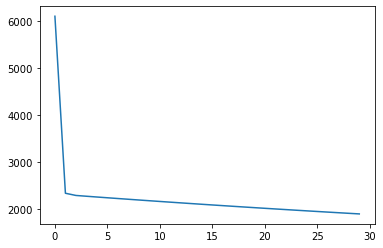

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import orth
plt.plot(recon_errors)
predict_tf = Z_recon

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import orth
for i in range(len(new_expre.iloc[0])):
    flag = False
    y = new_expre[gene_names["#ID"][i]]
    copy_new_expre = tf_exp.copy()
    try:
        del copy_new_expre[gene_names["#ID"][i]]
        print(gene_names["#ID"][i])
        temp_index = tf_names_list.index(gene_names["#ID"][i])
        flag = True
        print("T")  ###处理tf作为被调控因子的情况
    except:
        pass
    X = np.array(y)
    W_d = np.array(copy_new_expre)
    # computing average reconstruction-SNR
    #print(X.shape)
    #print(W_d.shape)
    net, err_list = train_lista(np.mat(X), np.mat(W_d), 0.1, 2)
    Z_recon = net(torch.from_numpy(X).float().to(device))
    Z_recon = Z_recon.detach().cpu().numpy()
    #print(Z_recon)

G1
T
G2
T
G3
T
G4
T
G5
T
G6
T
G7
T
G8
T
G9
T
G10
T
G11
T
G12
T
G13
T
G14
T
G15
T
G16
T
G17
T
G18
T
G19
T
G20
T
G21
T
G22
T
G23
T
G24
T
G25
T
G26
T
G27
T
G28
T
G29
T
G30
T
G31
T
G32
T
G33
T
G34
T
G35
T
G36
T
G37
T
G38
T
G39
T
G40
T
G41
T
G42
T
G43
T
G44
T
G45
T
G46
T
G47
T
G48
T
G49
T
G50
T
G51
T
G52
T
G53
T
G54
T
G55
T
G56
T
G57
T
G58
T
G59
T
G60
T
G61
T
G62
T
G63
T
G64
T
G65
T
G66
T
G67
T
G68
T
G69
T
G70
T
G71
T
G72
T
G73
T
G74
T
G75
T
G76
T
G77
T
G78
T
G79
T
G80
T
G81
T
G82
T
G83
T
G84
T
G85
T
G86
T
G87
T
G88
T
G89
T
G90
T
G91
T
G92
T
G93
T
G94
T
G95
T
G96
T
G97
T
G98
T
G99
T
G100
T
G101
T
G102
T
G103
T
G104
T
G105
T
G106
T
G107
T
G108
T
G109
T
G110
T
G111
T
G112
T
G113
T
G114
T
G115
T
G116
T
G117
T
G118
T
G119
T
G120
T
G121
T
G122
T
G123
T
G124
T
G125
T
G126
T
G127
T
G128
T
G129
T
G130
T
G131
T
G132
T
G133
T
G134
T
G135
T
G136
T
G137
T
G138
T
G139
T
G140
T
G141
T
G142
T
G143
T
G144
T
G145
T
G146
T
G147
T
G148
T
G149
T
G150
T
G151
T
G152
T
G153
T
G154
T
G155
T
G156
T
G157
T
G158
T
G1

KeyboardInterrupt: 

In [9]:
################################CosaMP算法（暂不可用）################################
import math
for i in range(len(new_expre.iloc[0])):
    flag = False
    y = new_expre[gene_names["#ID"][i]]
    copy_new_expre = tf_exp.copy()
    try:
        del copy_new_expre[gene_names["#ID"][i]]
        print(gene_names["#ID"][i])
        temp_index = tf_names_list.index(gene_names["#ID"][i])
        flag = True
        print("T")  ###处理tf作为被调控因子的情况
    except:
        pass
    predict_list = []
    par_lists = cs_CoSaMP(copy_new_expre,y)
    if flag:
        print(len(par_lists))
        par_lists = np.insert(par_lists, temp_index,0)
        print(len(par_lists))
    for j in range(len(temp_list[i])):
        temp_list[i][j] = par_lists[j]
    #print(par_lists)
    #network_predict.append(par_lists)
    #temp_index = list(gene_names[0]).index(tf_names[0][i])
    #par_lists.insert(temp_index,0)
    #network_predict_tf[temp_index] = par_lists
    print((i/len(new_expre.iloc[0])*100),"%")
predict_tf = temp_list

G1
T


TypeError: '(slice(None, None, None), array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181,
       182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193]))' is an invalid key

In [173]:
################################处理成二值矩阵################################
for i in range(len(predict_tf)):
    for j in range(len(predict_tf[i])):
        if predict_tf[i][j] > 0:
            predict_tf[i][j] = 1
        elif predict_tf[i][j]<0:
            predict_tf[i][j] = 1

In [44]:
predict_tf = Z_recon.T.A
predict_tf_copy = np.array(predict_tf.copy())
        
    
################################处理成二值矩阵################################
for i in range(len(predict_tf_copy)):
    for j in range(len(predict_tf_copy[i])):
        if predict_tf_copy[i][j] > 0.05:
            predict_tf_copy[i][j] = 1
        elif predict_tf_copy[i][j]<-0.05:
            predict_tf_copy[i][j] = 1
        else:
            predict_tf_copy[i][j] = 0

In [185]:
temp_list = np.zeros((len(name_list),len(tf_names_list)))
ista_list = predict_tf
predict_tf_copy = np.array(ista_list.copy())
for i in range(len(predict_tf_copy)):
    for j in range(len(predict_tf_copy[i])):
        predict_tf_copy[i][j] = abs(predict_tf_copy[i][j])
        
for i in range(len(predict_tf_copy)):
    for k in predict_tf_copy[i].argsort()[-80:][::-1]:
        temp_list[i][k] = 1
print(sum(temp_list[0]))

80.0


In [186]:
predict_tf = temp_list
predict_tf_copy = np.array(predict_tf.copy())
print(predict_tf)
print(network_tf)

[[0. 0. 0. ... 0. 0. 1.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]]


In [187]:
################################评分区################################
print(predict_tf_copy.shape)
print(network_tf.shape)
take_AUC(predict_tf_copy, network_tf.T)

(4511, 334)
(334, 4511)
[[1.]
 [1.]
 [1.]
 ...
 [1.]
 [1.]
 [1.]]
[[1.]
 [1.]
 [1.]
 ...
 [1.]
 [1.]
 [2.]]
0.5221191910323899


In [24]:
net_temp = network_tf.T
s = 0
k = 0
for i in range(len(predict_tf_copy)):
    for j in range(len(predict_tf_copy[i])):
        if net_temp[i][j] == predict_tf_copy[i][j]:
            s += 1
        else:
            k += 1
print(s)
print(k)

259321
61064


In [57]:
y = new_expre[gene_names["#ID"]]
copy_new_expre = tf_exp.copy()
X = np.array(y)
W_d = np.array(copy_new_expre)
#print(X)
#print(W_d)
net, err_list = train_lista(X.T, W_d, 0.3, 2)

RuntimeError: size mismatch, m1: [128 x 1643], m2: [195 x 805] at /Users/distiller/project/conda/conda-bld/pytorch_1595629449223/work/aten/src/TH/generic/THTensorMath.cpp:41

In [51]:
Z_recon = net(torch.from_numpy(X).float().to(device))
Z_recon = Z_recon.detach().cpu().numpy()
sum(sum(Z_recon))

0.0

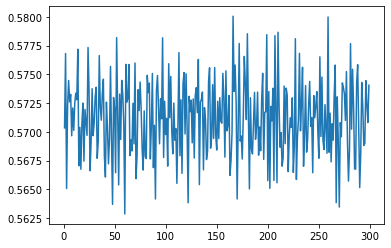

In [50]:
plt.plot(err_list)